In [2]:
# We import the packages along with other useful libraries.
%matplotlib inline
import astropy.units as u
import astropy.io.fits as fits
import numpy as np
from matplotlib.pyplot import *
from matplotlib import pyplot as plt
import vip_hci as vip
from hciplot import plot_frames, plot_cubes
import pyds9 as sao

In [53]:
# We import all the routines that will be used in this code.
from packaging import version
vvip = vip.__version__
print("VIP version: ", vvip)
if version.parse(vvip) < version.parse("1.0.0"):
    msg = "Please upgrade your version of VIP"
    msg+= "It should be 1.0.0 or above to run this notebook."
    raise ValueError(msg)
elif version.parse(vvip) <= version.parse("1.0.3"):
    from vip_hci.conf import VLT_NACO
    from vip_hci.medsub import median_sub
    from vip_hci.metrics import normalize_psf
    from vip_hci.pca import pca, pca_annular
else:
    from vip_hci.config import VLT_NACO
    from vip_hci.fm import normalize_psf
    from vip_hci.psfsub import median_sub, pca, pca_annular

# common to all versions:
from vip_hci.fits import open_fits, write_fits, info_fits
from vip_hci.metrics import significance, snr, snrmap, contrast_curve, detection, throughput 
from vip_hci.var import fit_2dgaussian, frame_center
from vip_hci.preproc import (approx_stellar_position, cube_correct_nan, cube_crop_frames,
                             cube_detect_badfr_correlation, cube_fix_badpix_annuli,
                             cube_fix_badpix_clump, cube_fix_badpix_isolated,
                             cube_px_resampling, cube_recenter_2dfit, cube_recenter_dft_upsampling,
                             cube_recenter_satspots, cube_recenter_via_speckles, cube_shift,
                             frame_center_radon, frame_crop, frame_fix_badpix_isolated)

VIP version:  1.4.0


## Loading ADI data

In [4]:
# Let’s first inspect the fits file
info_fits('/home/cvargas/sphere/AS209/data_K1_obj.fits')

Filename: /home/cvargas/sphere/AS209/data_K1_obj.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       7   (1024, 1024, 32)   float32   


In [7]:
# Now we load all the data in memory with the open_fits function
cubename = '/home/cvargas/sphere/AS209/data_K1_obj.fits'
psfname = '/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_PSF_MASTER_CUBE-median_unsat.fits'
anglename = '/home/cvargas/sphere/AS209/ird_convert_recenter_dc2021-IRD_SCIENCE_PARA_ROTATION_CUBE-rotnth.fits'

cube = open_fits('/home/cvargas/sphere/AS209/data_K1_obj.fits')
psf = open_fits('/home/cvargas/sphere/AS209/HIP 82323_DB_K12_2021-04-06_ird_convert_recenter_dc2021_BEAST_305262/ird_convert_recenter_dc2021-IRD_SCIENCE_PSF_MASTER_CUBE-median_unsat.fits')
angle = open_fits('/home/cvargas/sphere/AS209/ird_convert_recenter_dc2021-IRD_SCIENCE_PARA_ROTATION_CUBE-rotnth.fits')

Fits HDU-0 data successfully loaded. Data shape: (32, 1024, 1024)
Fits HDU-0 data successfully loaded. Data shape: (2, 5, 64, 64)
Fits HDU-0 data successfully loaded. Data shape: (32,)


In [9]:
# Let's see the parallactic angles
angle

array([-20.327301  , -20.218826  , -20.096222  , -19.982513  ,
       -19.854256  , -19.735107  , -19.600746  , -19.475891  ,
       -17.175224  , -16.995262  , -16.79512   , -16.606415  ,
       -16.393845  , -16.195816  , -15.975601  , -15.767822  ,
       -10.924171  , -10.593399  , -10.21962   ,  -9.871208  ,
        -9.482689  ,  -9.115486  ,  -8.699844  ,  -8.312508  ,
        -1.5937805 ,  -1.017273  ,  -0.36183167,   0.24732971,
         0.9362793 ,   1.5805054 ,   2.2996979 ,   2.9806824 ],
      dtype=float32)

In [22]:
psf[0][0].shape 

(64, 64)

New shape: (32, 100, 100)


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time]   (flux)
:Cube_shape	[100, 100, 32]


:HoloMap   [time]
   :Image   [x,y]   (flux)
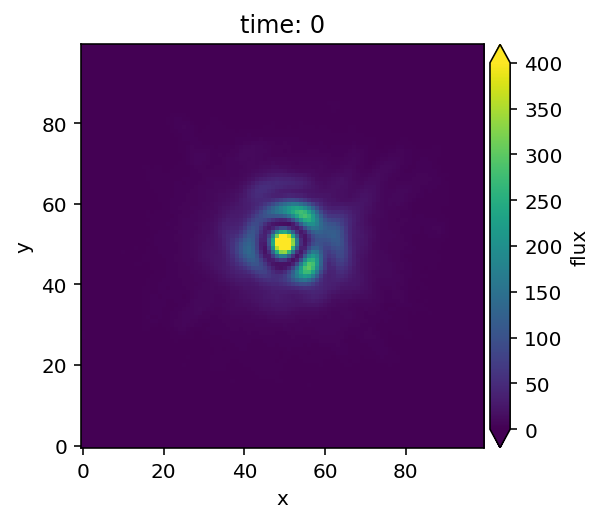
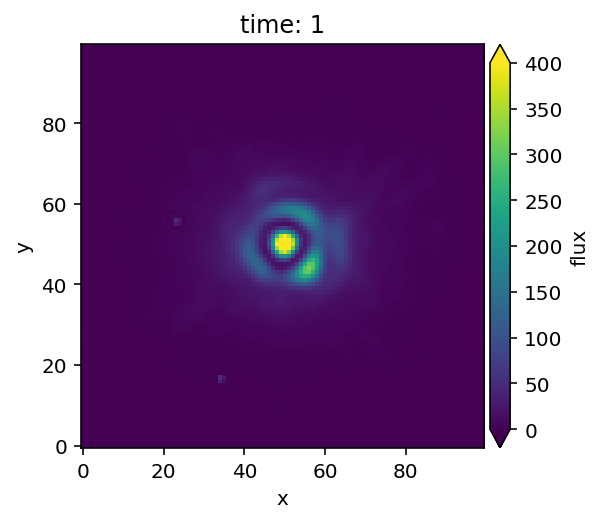
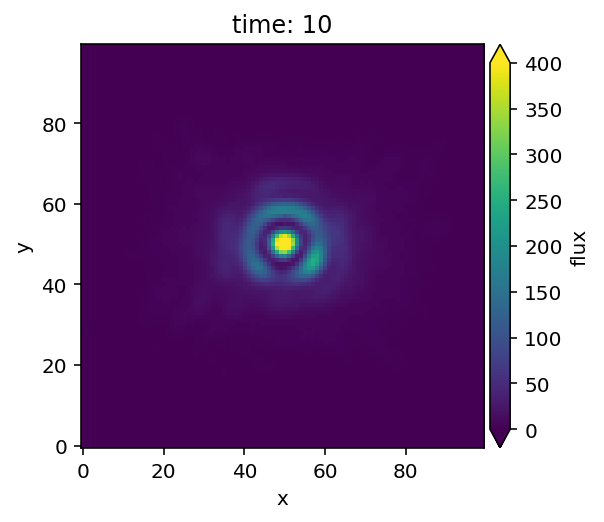
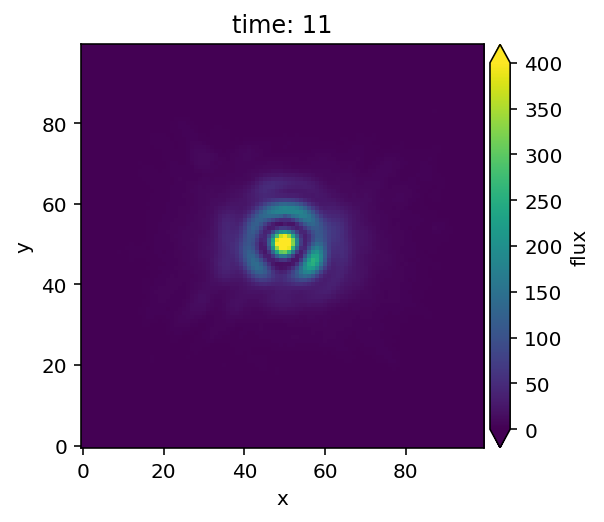
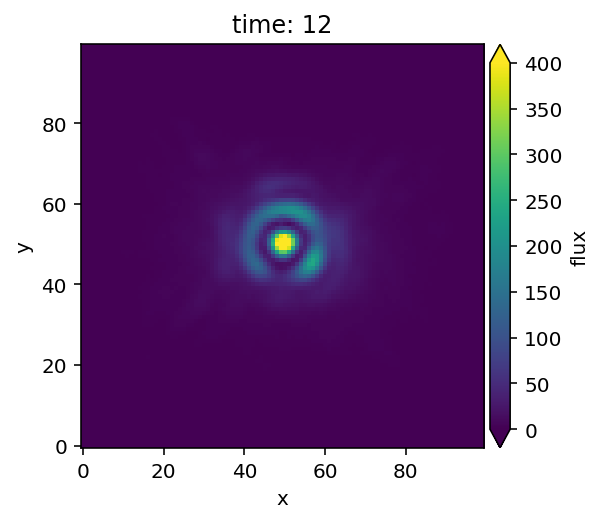
...
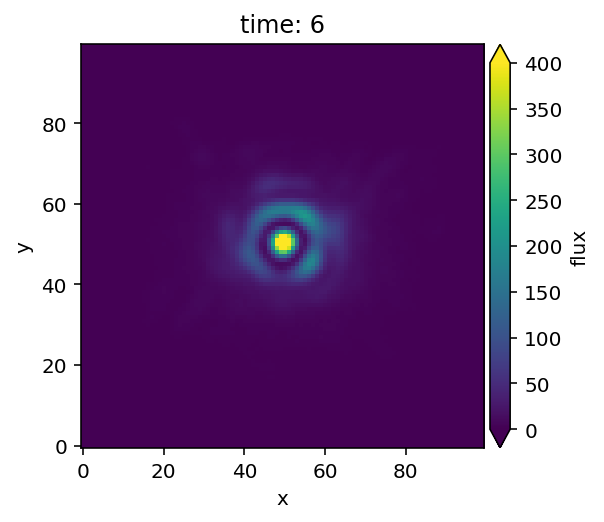
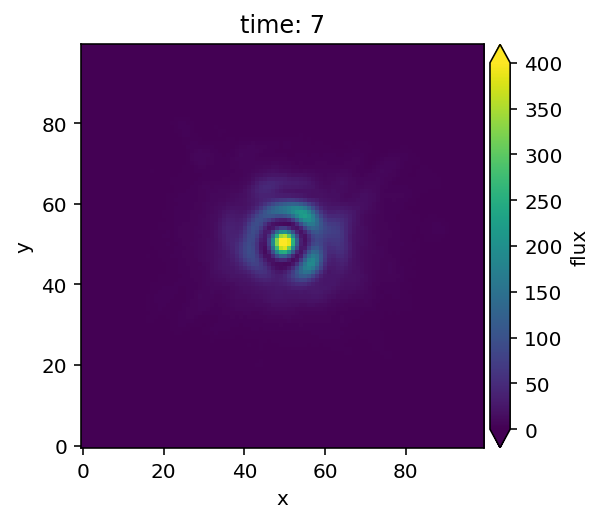
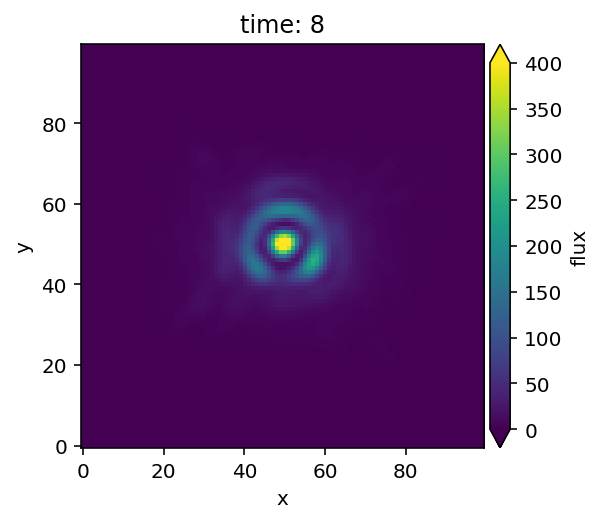
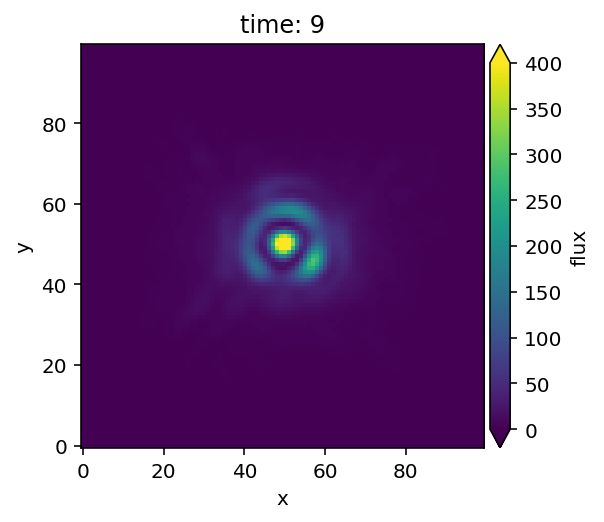
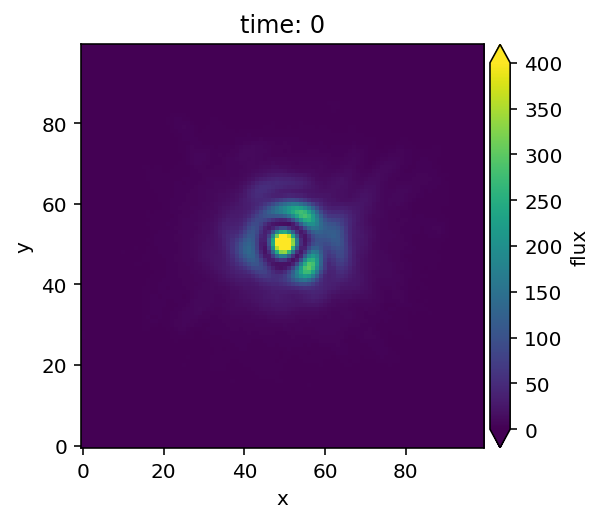

In [15]:
# Let's visualize the cube
plot_cubes(cube_crop_frames(cube,100), dynamic=False, vmin=0, vmax=400)

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W

:Dataset   [x,y,time,lambda]   (flux)
:Cube_shape	[64, 64, 5, 2]


:HoloMap   [time,lambda]
   :Image   [x,y]   (flux)
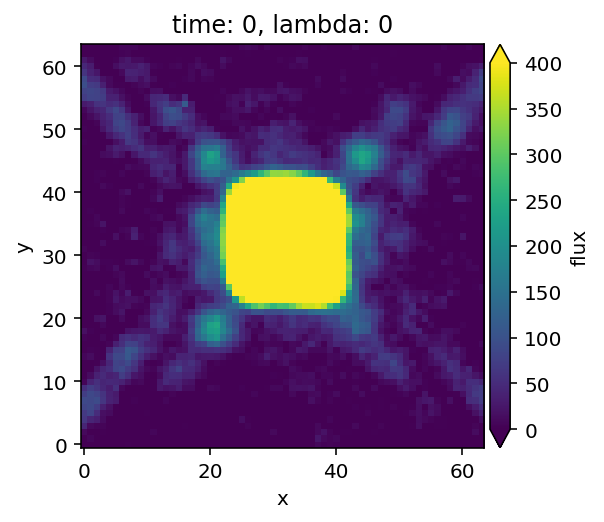
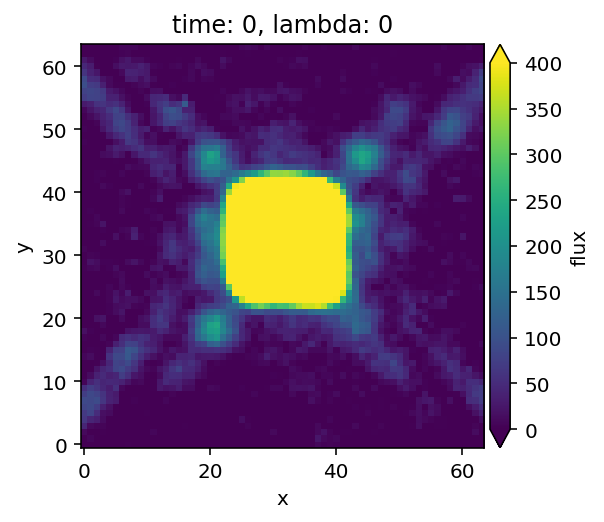
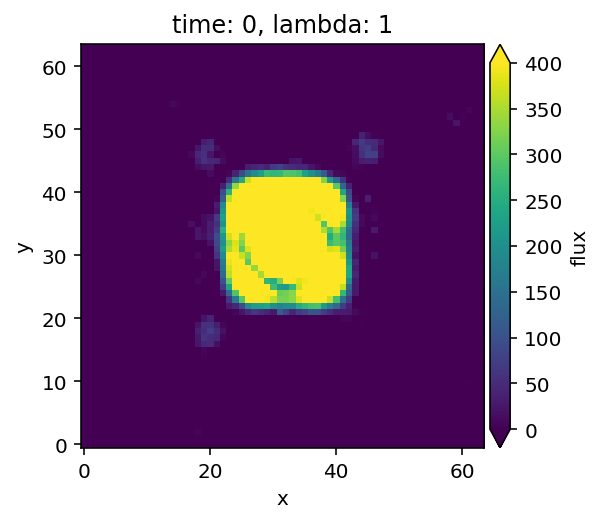
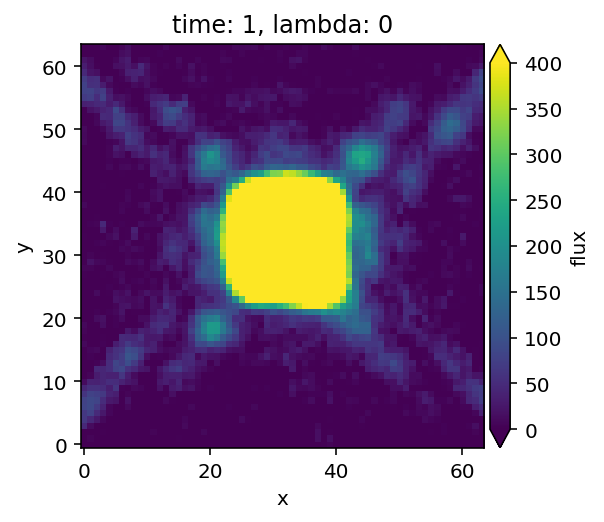
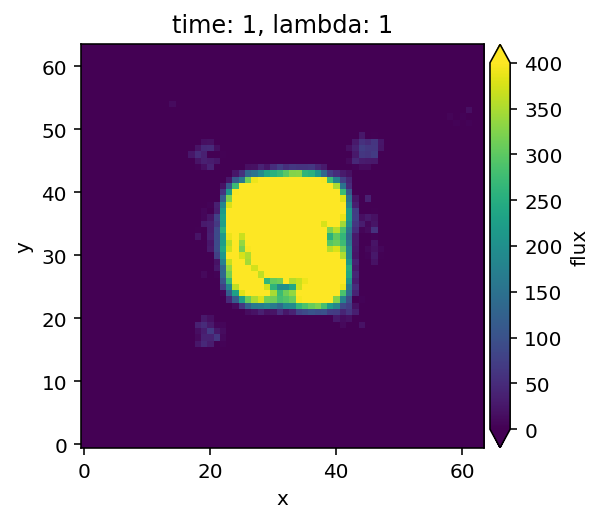
...
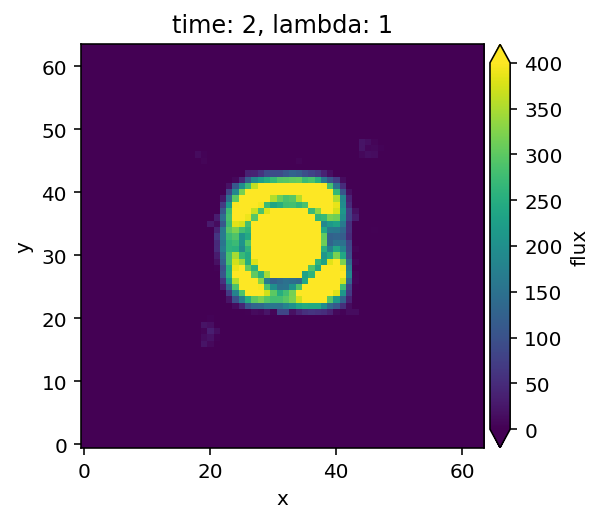
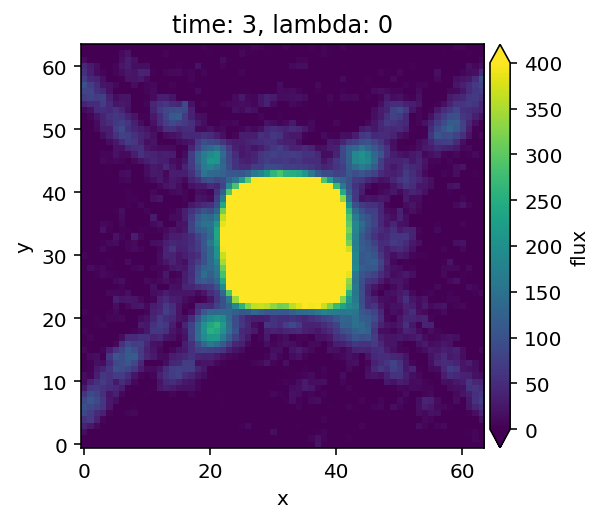
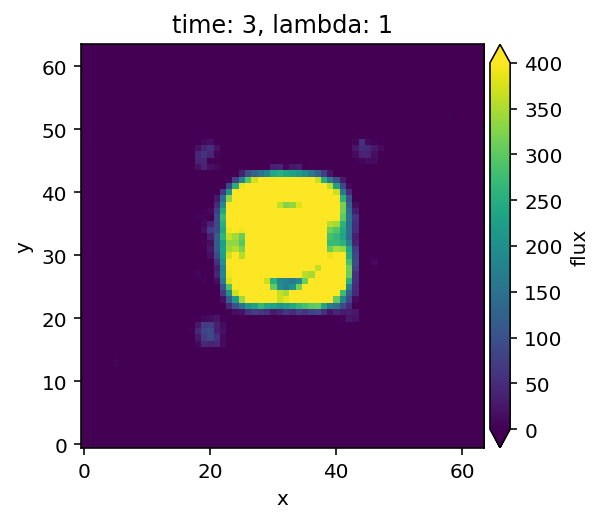
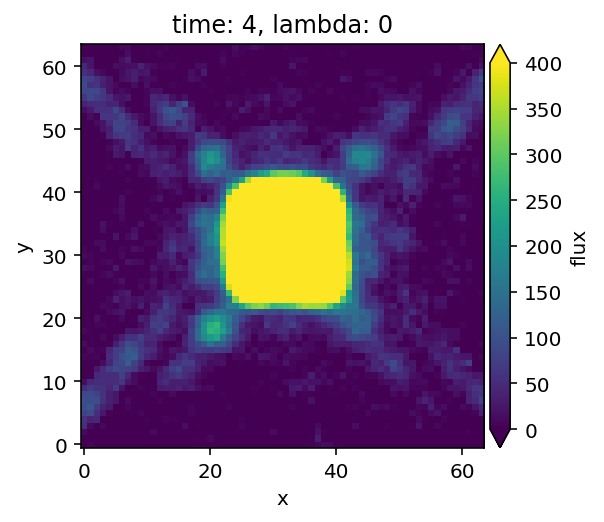
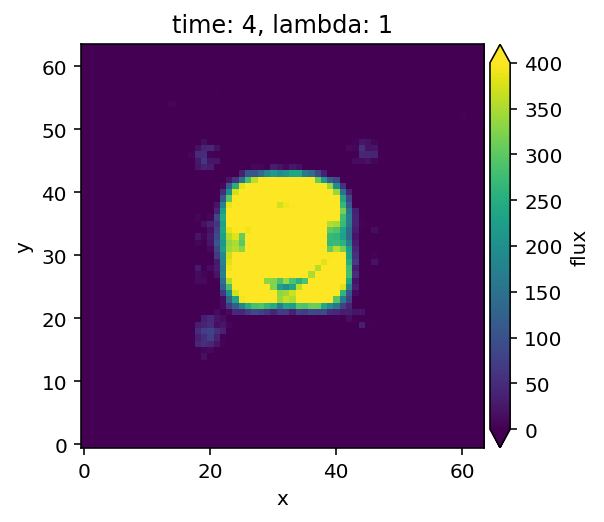

In [16]:
# Let's visualize the psf
plot_cubes(psf, dynamic=False, vmin=0, vmax=400)

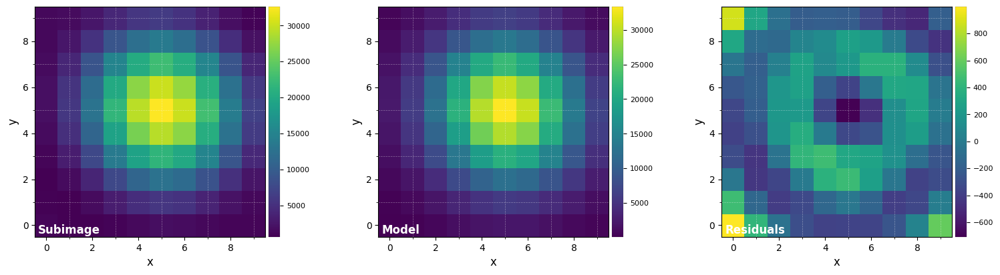

FWHM_y = 5.059103915671366
FWHM_x = 5.256553442859861 

centroid y = 32.063358384209046
centroid x = 32.07111407369198
centroid y subim = 5.063358384209048
centroid x subim = 5.071114073691982 

amplitude = 33385.36333190134
theta = -33.56556332668014


In [26]:
# Let’s measure the Full-Width Half-Maximum (FWHM) by fitting a 2D Gaussian to the core of the unsaturated non-coronagraphic PSF.
%matplotlib inline
DF_fit = fit_2dgaussian(psf[0][0], crop=True, cropsize=10, debug=True, full_output=True)

In [40]:
fwhm_sphere = np.mean([DF_fit['fwhm_x'],DF_fit['fwhm_y']])
print(fwhm_sphere)

5.157828679265613


In [33]:
# Let's normalize the flux to one in a 1xFWHM aperture and crop the PSF array
psfn = normalize_psf(psf[0][0], fwhm_sphere, size=19, imlib='ndimage-fourier')

Flux in 1xFWHM aperture: 500880.322


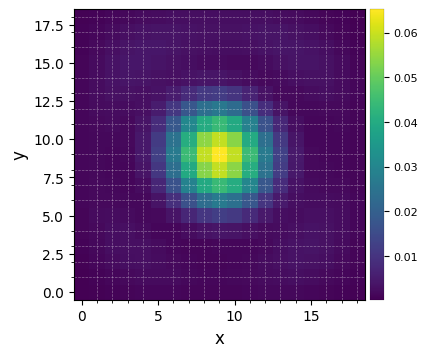

In [34]:
plot_frames(psfn, grid=True, size_factor=4)

In [61]:
# Let's define the pixel scale for SPHERE (IRDIS)
mas = 12.27 * u.mas
arcsec = mas.to(u.arcsec)/u.arcsec
arcsec

<Quantity 0.01227>

## Model PSF subtraction for ADI

In [38]:
# We set the preferred method to be used for image rotation.
imlib = 'vip-fft'
interpolation=None

### Median-ADI

This method model the PSF with the median of the ADI sequence, subtract it, then derotate and median-combine all residual images.

In [39]:
fr_adi = median_sub(cube, angle, imlib=imlib, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-04-25 12:52:44
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Median psf reference subtracted
Done derotating and combining
Running time:  0:03:38.803972
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [42]:
fr_adi_an = median_sub(cube, angle, fwhm_sphere, asize=fwhm_sphere, mode='annular', radius_int=4, nframes=4, imlib=imlib, interpolation=interpolation)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-04-25 13:05:00
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
N annuli = 98, FWHM = 4
PA threshold 33.82 is likely too big, will be set to 10.49
PA threshold 19.34 is likely too big, will be set to 10.49
PA threshold 13.50 is likely too big, will be set to 10.49
Optimized median psf reference subtracted
Done derotating and combining
Running time:  0:03:47.920574
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (210, 210)
New shape: (210, 210)


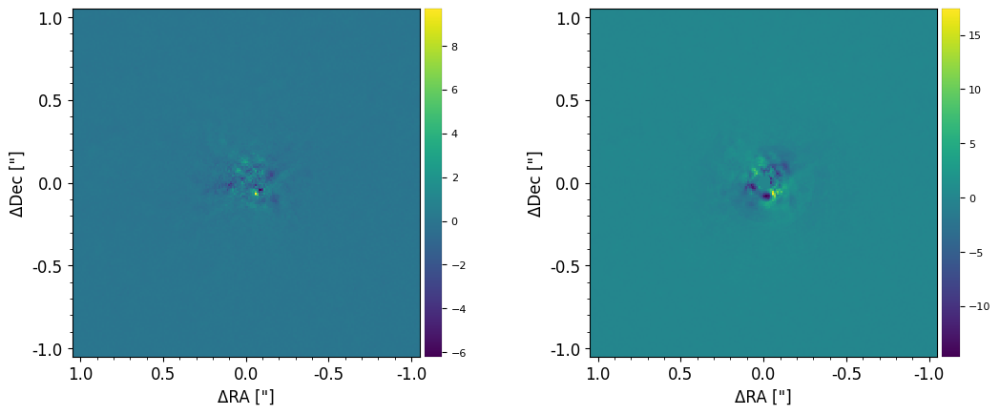

In [43]:
plot_frames((frame_crop(fr_adi, 210),frame_crop(fr_adi_an, 210)), backend='matplotlib', ang_scale=True)

### Full-frame PCA

In [44]:
fr_pca1 = pca(cube, angle, ncomp=5, mask_center_px=None, imlib=imlib, interpolation=interpolation,
              svd_mode='lapack')

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-04-25 14:19:21
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
System total memory = 134.824 GB
System available memory = 126.664 GB
Done vectorizing the frames. Matrix shape: (32, 1048576)
Done SVD/PCA with numpy SVD (LAPACK)
Running time:  0:00:03.668488
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Done de-rotating and combining
Running time:  0:04:57.532591
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


New shape: (110, 110)


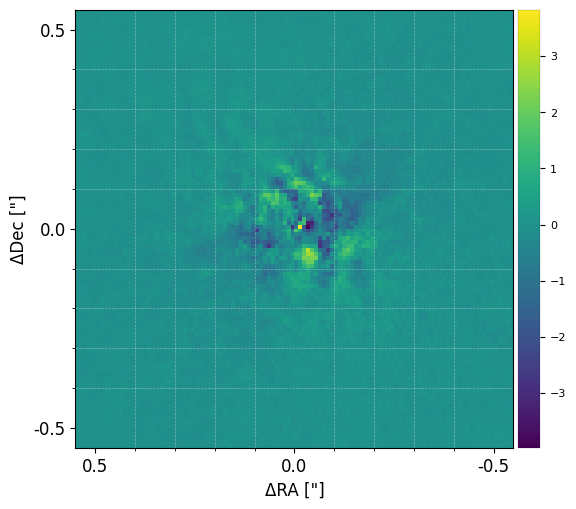

In [45]:
plot_frames((frame_crop(fr_pca1, 110)), backend='matplotlib', ang_scale=True, grid=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-04-25 14:26:26
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


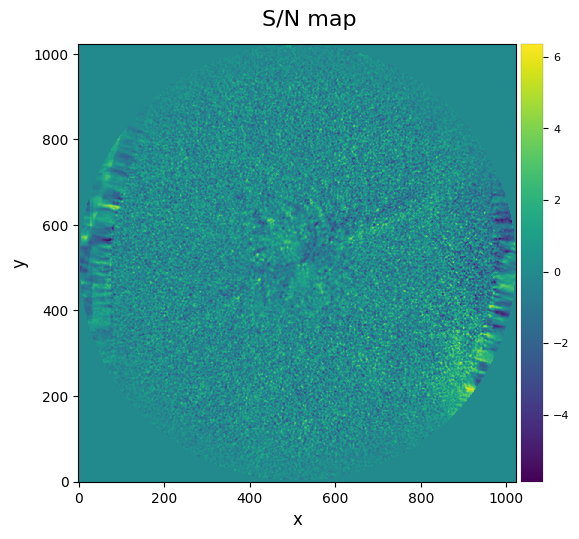

S/N map created using 24 processes
Running time:  0:17:39.248756
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


In [46]:
# We calculate a S/N ratio map over the whole image
snrmap1 = snrmap(fr_pca1, fwhm_sphere, plot=True)

## Throughput and contrast curves

### Throughput

In [47]:
res_thr = throughput(cube, angle, psfn, fwhm_sphere, ncomp=15,
                     algo=pca, nbranch=1, full_output=True)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-04-25 15:00:41
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube without fake companions processed with pca
Running time:  0:04:56.729331
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Measured annulus-wise noise in resulting frame
Running time:  0:04:57.831044
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Flux in 1xFWHM aperture: 1.000
Fake companions injected in branch 1 (pattern 1/3)
Running time:  0:05:14.712244
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Cube with fake companions processed with pca
Measuring its annulus-wise throughput
Running time:  0:10:11.111201
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Fake companions injected in branch 1 (pattern 2/3)
Running time:  0:10:28.435006
――――――――――――――――――

Text(0.5, 0, 'separation in pixels')

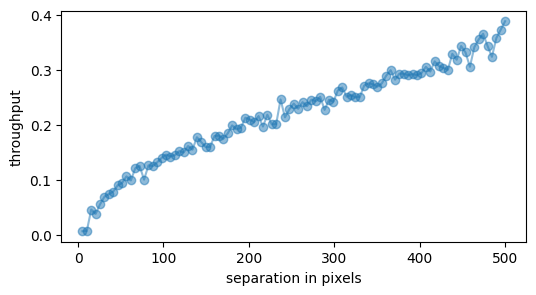

In [48]:
figure(figsize=(6,3))
plot(res_thr[3], res_thr[0][0,:], 'o-', alpha=0.5)
ylabel('throughput')
xlabel('separation in pixels')

Let’s compare this with the annular PCA result:

In [54]:
res_thr2 = throughput(cube, angle, psfn, fwhm_sphere, algo=pca_annular, nbranch=1, verbose=False,
                      full_output=True, ncomp=10, radius_int=int(fwhm_sphere))

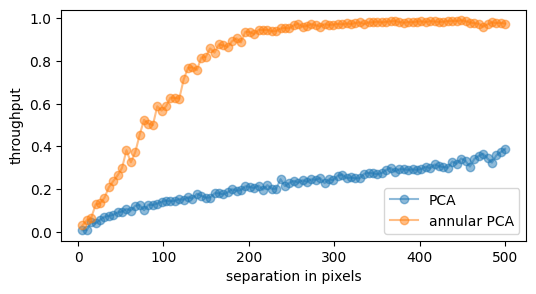

In [55]:
figure(figsize=(6,3))
plot(res_thr[3], res_thr[0][0,:], 'o-', label='PCA', alpha=0.5)
plot(res_thr2[3], res_thr2[0][0,:], 'o-', label='annular PCA', alpha=0.5)
ylabel('throughput')
xlabel('separation in pixels')
_ = legend(loc='best')

### Contrast curves

In [56]:
nsig=5

Why we used sigma equal to 5?

In [59]:
starphot = 764939.6

Where can I obtain the aperture photometry of the non-coronagraphic PSF (starphot)?

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Starting time: 2023-04-25 17:43:20
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
ALGO : pca, FWHM = 5.157828679265613, # BRANCHES = 1, SIGMA = 5, STARPHOT = 764939.6
Finished the throughput calculation
Running time:  0:15:17.407392
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


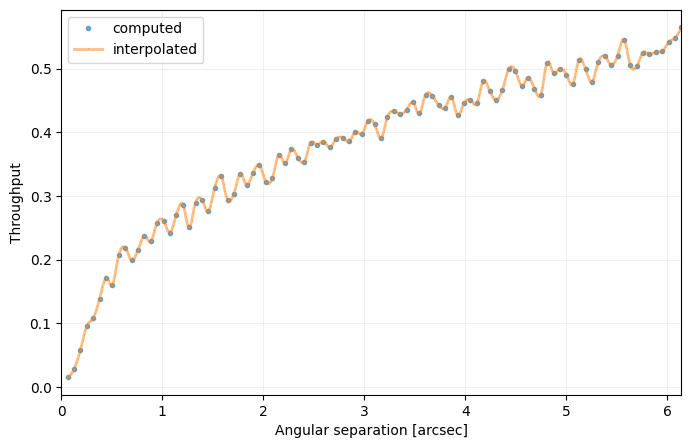

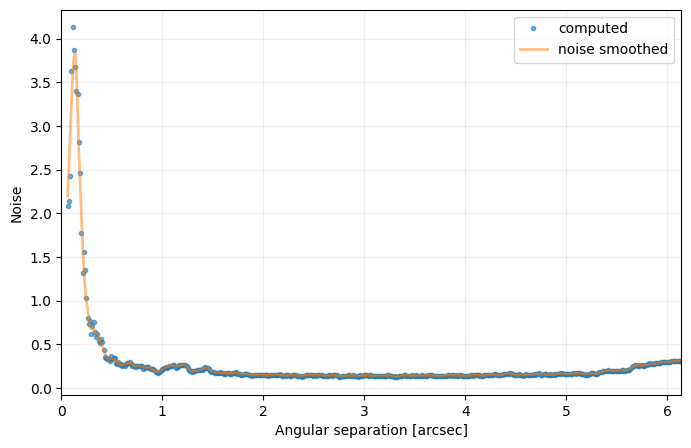

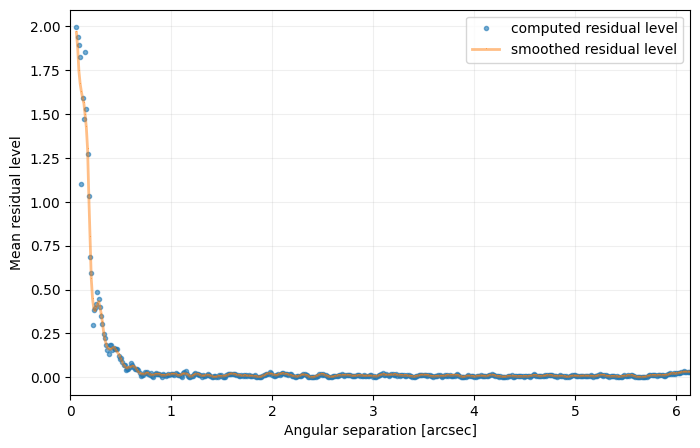

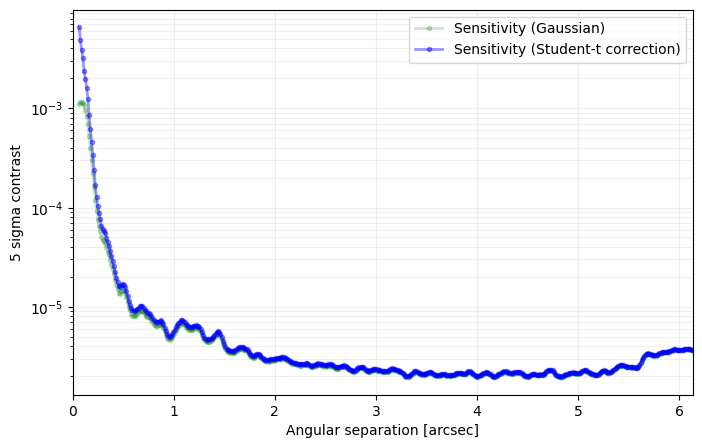

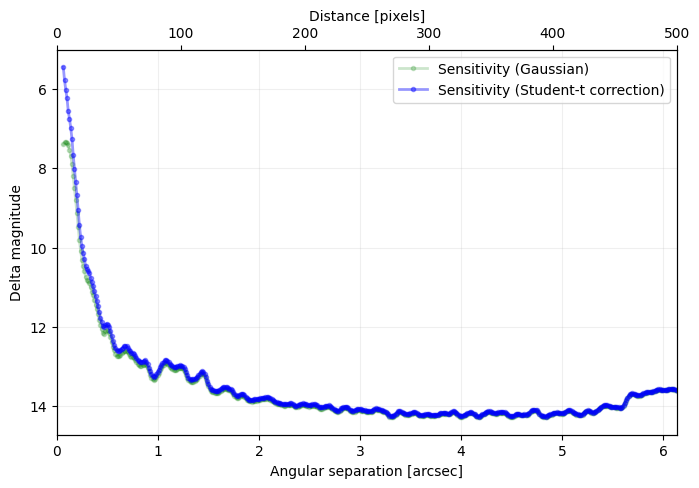

In [62]:
cc_1 = contrast_curve(cube, angle, psfn, fwhm=fwhm_sphere, pxscale=arcsec, starphot=starphot,
                      sigma=nsig, nbranch=1, algo=pca, ncomp=9, debug=True)

In [58]:
help(contrast_curve)

Help on function contrast_curve in module vip_hci.metrics.contrcurve:

contrast_curve(cube, angle_list, psf_template, fwhm, pxscale, starphot, algo, sigma=5, nbranch=1, theta=0, inner_rad=1, fc_rad_sep=3, noise_sep=1, wedge=(0, 360), fc_snr=100, student=True, transmission=None, smooth=True, interp_order=2, plot=True, dpi=100, debug=False, verbose=True, full_output=False, save_plot=None, object_name=None, frame_size=None, fix_y_lim=(), figsize=(8, 5), **algo_dict)
    Computes the contrast curve at a given confidence (``sigma``) level for 
    an ADI cube or ADI+IFS cube. The contrast is calculated as
    sigma*noise/throughput. This implementation takes into account the small
    sample statistics correction proposed in [MAW14]_.
    
    Parameters
    ----------
    cube : 3d or 4d numpy ndarray
        The input cube, 3d (ADI data) or 4d array (IFS data), without fake
        companions.
    angle_list : 1d numpy ndarray
        Vector with parallactic angles.
    psf_template : 2d 